# Harreman tutorial: Metabolic zonation on the 10x Visium mouse colon dataset

In this tutorial, we go through the steps of performing metabolic zonation with Harreman, an algorithm for identifying metabolic crosstalk from spatially resolved transcriptomics of intact tissues. Harreman reconstructs molecular metabolic crosstalk based on co-localized expression of metabolite transporters. By utilizing a series of increasingly detailed models for testing spatial correlation, Harreman provides insight at multiple levels: a) coarse partition of the tissue into regions sharing metabolic characteristics; b) identification of metabolic exchanges within each region; and c) inference of the cell subsets involved in those exchanges.

Plan for this tutorial:

1. Loading the data.
2. Filtering out lowly expressed genes.
3. Computing metabolic enzyme autocorrelation to identify spatially relevant genes.
4. Computing local correlations between spatial genes to identify modules.
5. Computing module scores and visualizing them across the slides.
6. Grouping similar modules together into super-modules.
7. Assigning top-scoring super-modules to every spot. 
8. Characterizing the abundance of each module along the proximal-distal and serosa-luminal axes.

## Loading the dataset

In this tutorial, we will work with a mouse colon dataset (Parigi et al., *Nature communications*, 2022) profiled using a Dextran Sulfate Sodium (DSS)-induced colitis mouse model. The dataset consists of two tissue sections, one from each mouse, profiled with 10x Visium (6,175 spots of 55 micrometers in diameter in total). The first section was obtained before DSS administration, and the second one on day 14 after the inflammation peaked and early regeneration began. The tissue was rolled from the proximal to the distal side of the colon, which is commonly known in the field as a Swiss roll. This is a standard histology protocol to fit the entire colon on one slide for posterior sequencing.

The raw data was obtained from https://github.com/ludvigla/healing_intestine_analysis.

For digital unrolling, tif images corresponding to both conditions were downloaded from https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSM5213483 (Day 0) and https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSM5213484 (Day 14) and were added to the *spatial* folder (under *V19S23-097_A1* and *V19S23-097_B1* for Day 0 and Day 14, respectively).

In [1]:
import harreman
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import mplscience
from scipy.stats import mannwhitneyu
from scipy.stats import zscore, norm
from statsmodels.stats.multitest import multipletests
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.utils import resample
import warnings
warnings.filterwarnings("ignore")

We load the dataset using the function below. The data corresponding to one individual sample can also be loaded by specifying the sample name to the `sample` argument. For example, if I only wanted to load the data corresponding to sample *d0*, we would use the command below:

`adata = harreman.datasets.load_slide_seq_human_lung_dataset(sample='d0')`

The dataset consists of the *d0* and *d14* samples, but in this tutorial we will make use of both samples.

In [2]:
adata = harreman.datasets.load_visium_mouse_colon_dataset()

100%|██████████| 793M/793M [00:16<00:00, 49.4MB/s] 


In [3]:
adata

AnnData object with n_obs × n_vars = 6168 × 31053
    obs: 'in_tissue', 'array_row', 'array_col', 'cond', 'id', 'row', 'col', 'layer', 'ord', 'dist', 'spot', 'pixel_x', 'pixel_y'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'cond_colors'
    obsm: 'spatial', 'spatial_unrolled'
    layers: 'counts', 'log_norm', 'normalized'

We then filter out genes expressed in less than 50 spots per sample.

In [4]:
sample_col = 'cond'
n_genes_expr = 50
genes_to_keep = np.zeros(adata.shape[1], dtype=bool)

for sample in adata.obs[sample_col].unique():
    adata_sample = adata[adata.obs[sample_col] == sample]
    expressed = np.array((adata_sample.X > 0).sum(axis=0)).flatten()
    genes_to_keep |= expressed >= n_genes_expr

adata = adata[:, genes_to_keep].copy()

In [5]:
adata

AnnData object with n_obs × n_vars = 6168 × 13967
    obs: 'in_tissue', 'array_row', 'array_col', 'cond', 'id', 'row', 'col', 'layer', 'ord', 'dist', 'spot', 'pixel_x', 'pixel_y'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'cond_colors'
    obsm: 'spatial', 'spatial_unrolled'
    layers: 'counts', 'log_norm', 'normalized'

## Functions

We also load the function that will be used to perform the polynomial regression of the modules along the proximal-distal and the serosa-luminal axes.

In [6]:
def polynomial_regression(adata, cond, super_modules, fraction_df, var, xlabel, y_min, y_max, degree = 3, figsize=(8, 6)):

    X = adata.obs[var].dropna().values.reshape(-1, 1)
    X_high_res = np.linspace(X.min(), X.max(), 500).reshape(-1, 1)

    plt.figure(figsize=figsize)
    
    mods_cond = fraction_df[fraction_df['cond'] == cond]['top_super_module'].tolist()
    
    p_values_uniform = []
    p_values_perm = []
    
    for mod in super_modules:
        
        if mod not in mods_cond:
            continue
        
        y = zscore(adata.obs[mod].loc[adata.obs[var].dropna().index].values)

        # Fit polynomial regression
        poly = PolynomialFeatures(degree=degree)
        X_poly = poly.fit_transform(X)

        model = LinearRegression()
        model.fit(X_poly, y)
        
        # Predict mean
        X_high_res_poly = poly.transform(X_high_res)
        y_pred = model.predict(X_high_res_poly)

        # Bootstrap resampling for confidence intervals
        n_bootstrap = 1000
        bootstrap_preds = []

        for _ in range(n_bootstrap):
            X_sample, y_sample = resample(X, y)
            X_sample_poly = poly.fit_transform(X_sample)
            bootstrap_model = LinearRegression()
            bootstrap_model.fit(X_sample_poly, y_sample)
            bootstrap_preds.append(bootstrap_model.predict(X_high_res_poly))

        bootstrap_preds = np.array(bootstrap_preds)

        # Calculate 95% confidence intervals
        lower_bound = np.percentile(bootstrap_preds, 2.5, axis=0)
        upper_bound = np.percentile(bootstrap_preds, 97.5, axis=0)

        # Plot mean prediction and confidence interval
        line_width_factor = fraction_df[(fraction_df['cond'] == cond) & (fraction_df['top_super_module'] == mod)]['Fraction'].tolist()[0]
        plt.plot(X_high_res, y_pred, label=f'{mod} (Mean)', linewidth=8*line_width_factor)
        plt.fill_between(X_high_res.flatten(), lower_bound, upper_bound, alpha=0.2, label=f'{mod} (95% CI)')
        plt.ylim(y_min, y_max)
    
    # Customize plot
    plt.xlabel(xlabel)
    plt.ylabel('Z-scored module score')
    plt.title(cond)
    
    return

## Metabolic zonation

Firstly, we compute the neighborhood graph using the `compute_knn_graph` function. For this, we need to specify the latent (or observed) space we are using to compute our cell metric with the `compute_neighbors_on_key` parameter. Further, only one of `compute_neighbors_on_key` or `distances_obsp_key` is needed in order to run the function. Similarly, either the `neighborhood_radius` or the `n_neighbors` parameter needs to be used (the former needs to contain information in micrometers). The `sample_key` parameter is optional and is only required when more than one sample are present in the AnnData and we want to avoid having neighbors across different samples.

Here, we set `weighted_graph=False` to just use binary, 0-1 weights and `n_neighbors=5` to create a local neighborhood in the unrolled tissue space with the 5 nearest neighbors for every spot. Larger neighborhood sizes can result in more robust detection of correlations and autocorrelations at a cost of missing more fine-grained, smaller-scale, spatial patterns. Further, we set `sample_key='cond'` to make sure there are no shared neighbors between samples. Note that the neighbors are computed in the unrolled tissue space and not in the original coordinates. This is because the unrolled coordinates preserve *in vivo* spatial relationships more faithfully than the histological Swiss roll.

In [7]:
harreman.tl.compute_knn_graph(adata, 
                           compute_neighbors_on_key="spatial_unrolled", 
                           n_neighbors=5,
                           weighted_graph=False,
                           sample_key='cond',
                           verbose=True)

Computing the neighborhood graph...
Restricting graph within samples using 'cond'...


100%|██████████| 2/2 [00:00<00:00, 105.50it/s]

Computing the weights...
Finished computing the KNN graph in 0.046 seconds


Once the neighborhood graph is computed, local autocorrelation needs to be assessed using the `compute_local_autocorrelation` function. For this, we need to specify the gene counts matrix (with the `layer_key` parameter), which background model to use (with the `model` parameter), the per-cell scaling factor (optional, with the `umi_counts_obs_key` parameter), and whether we want to focus on metabolic genes or not (with the `use_metabolic_genes` parameter; False by default). In case we focus on metabolic enzymes, the `species` parameter is used to specify the organism dataset corresponds to. Further, the empirical test can also be run by permutation testing to later compare the results with the theoretical one (with the `permutation_test` parameter).

Here, we are focusing on the metabolic enzymes from mouse and we are using the negative binomial distribution to model our count data.

In [9]:
harreman.hs.compute_local_autocorrelation(adata, layer_key="counts", model='danb', species='mouse', use_metabolic_genes=True, verbose=True)

Computing local autocorrelation...
Local autocorrelation results are stored in adata.uns['gene_autocorrelation_results']
Finished computing local autocorrelation in 0.273 seconds


We only use those genes with a significant autocorrelation (FDR < 0.01) for the subsequent analysis.

In [9]:
gene_autocorrelation_results = adata.uns['gene_autocorrelation_results']
genes = gene_autocorrelation_results.loc[gene_autocorrelation_results.Z_FDR < 0.01].sort_values('Z', ascending=False).index

To get a better idea of what spatial patterns exist, it is helpful to group the genes into modules. This is done by using the concept of *local correlations* - that is, correlations that are computed between genes between cells in the same neighborhood.

Here, we avoid running the calculation for all Genes x Genes pairs and instead only run this on genes that have significant spatial autocorrelation to begin with.

The `compute_local_correlation` function returns a Genes x Genes matrix of Z-scores for the significance of the correlation between genes. This object is retained in the AnnData object and is used in the subsequent steps.

In [10]:
harreman.hs.compute_local_correlation(adata, genes=genes, verbose=True)

Computing pair-wise local correlation on 759 features...
Pair-wise local correlation results are stored in adata.uns with the following keys: ['lcs', 'lc_zs', 'lc_z_pvals', 'lc_z_FDR']
Finished computing pair-wise local correlation in 0.369 seconds


Now that pairwise local correlations are calculated, we can group genes into modules.

To do this, the `create_modules` function is used, which performs agglomerative clustering with two caveats:

1. If the FDR-adjusted p-value of the correlation between two branches exceeds `fdr_threshold`, then the branches are not merged.

2. If two branches are to be merged and they both have at least `min_gene_threshold` genes, then the branches are not merged. Further genes that would join to the resulting merged module (and are therefore ambiguous) either remain unassigned (if `core_only=True`) or are assigned to the module with the smaller average correlations between genes, i.e. the least-dense module (if `core_only=False`). Unassigned genes are indicated with a module number of -1.

In [11]:
harreman.hs.create_modules(adata, min_gene_threshold=20)

We then can visualize the created modules.

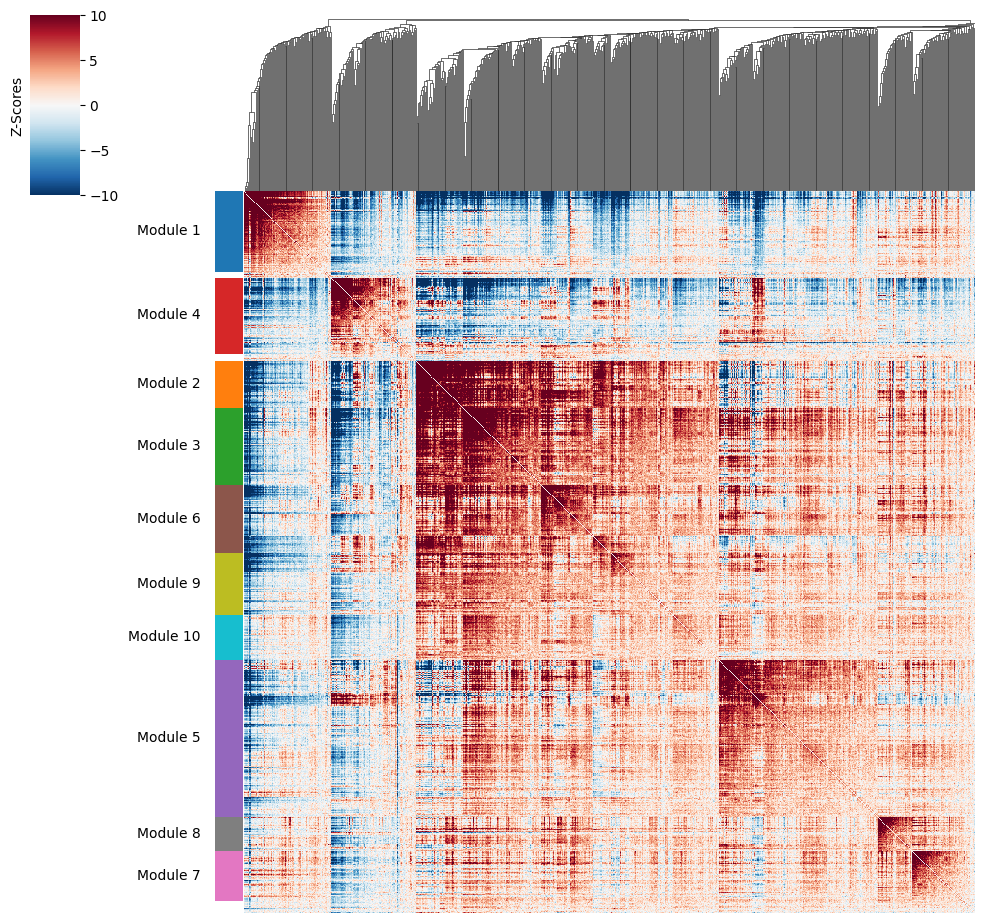

In [12]:
harreman.pl.local_correlation_plot(adata)

To characterize the general behavior of a module, module scores are computed.

In [13]:
harreman.hs.calculate_module_scores(adata)

100%|██████████| 10/10 [00:01<00:00,  5.47it/s]


In [14]:
modules = adata.obsm['module_scores'].columns
adata.obs[modules] = adata.obsm['module_scores']

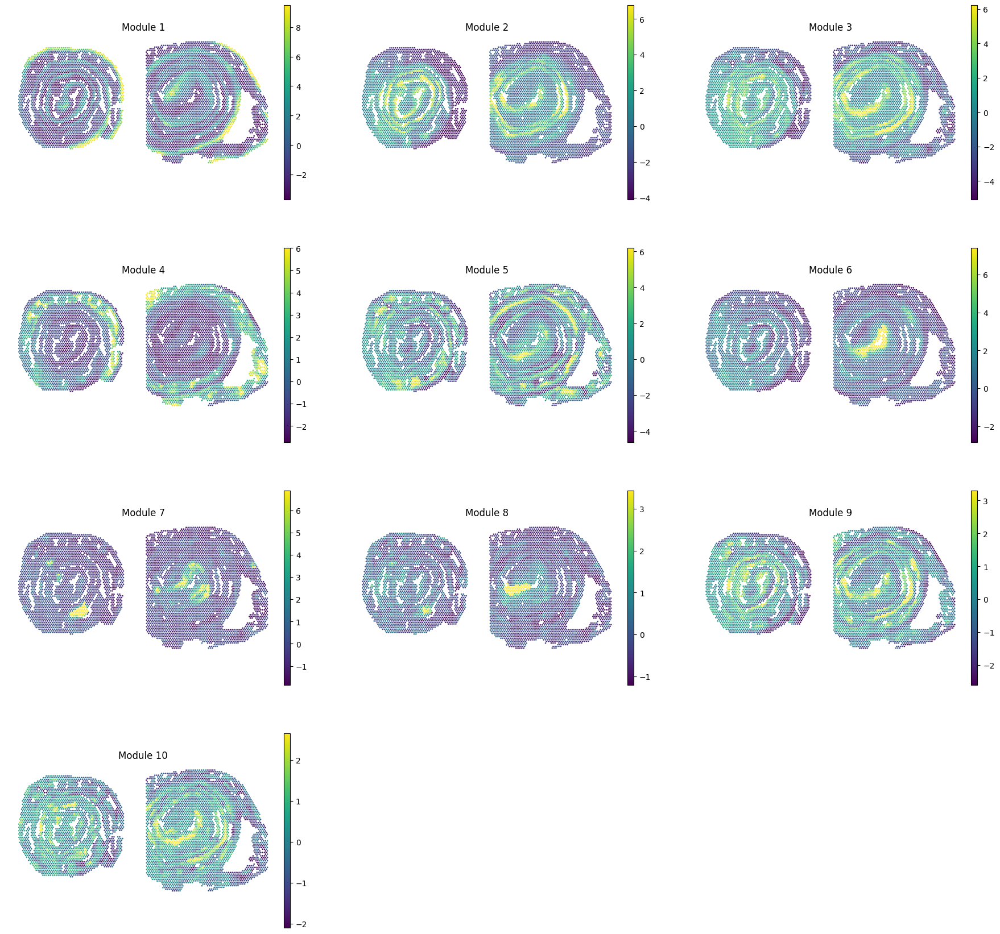

In [15]:
sc.pl.spatial(adata, color=modules, spot_size=80, frameon=False, vmin="p1", vmax="p99", ncols=3, cmap='viridis')

Once gene modules have been computed, we might want to group similar ones together or ignore unspecific or noisy modules for tissue zonation. For this, we can visualize the average pairwise Z-scores between modules.

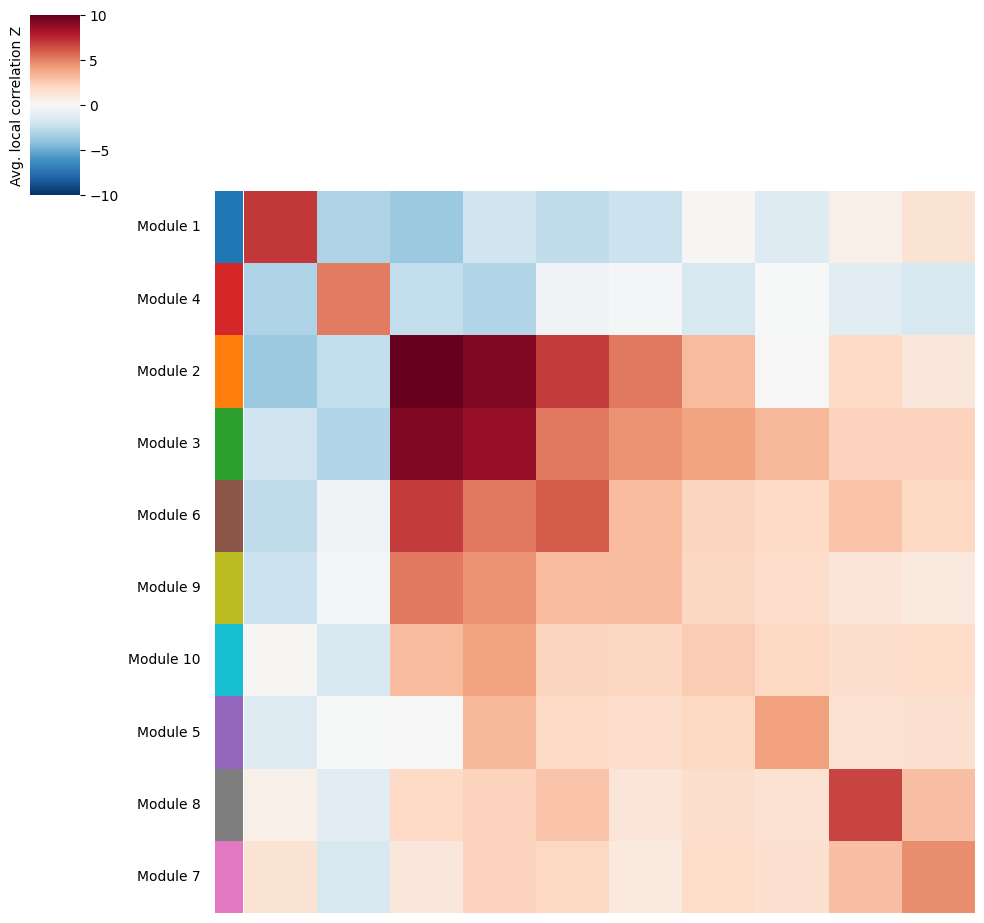

In [16]:
harreman.pl.average_local_correlation_plot(adata, col_cluster=False, row_cluster=False)

Additionally, we can also visualize the correlations between module scores to identify modules with a similar spatial pattern.

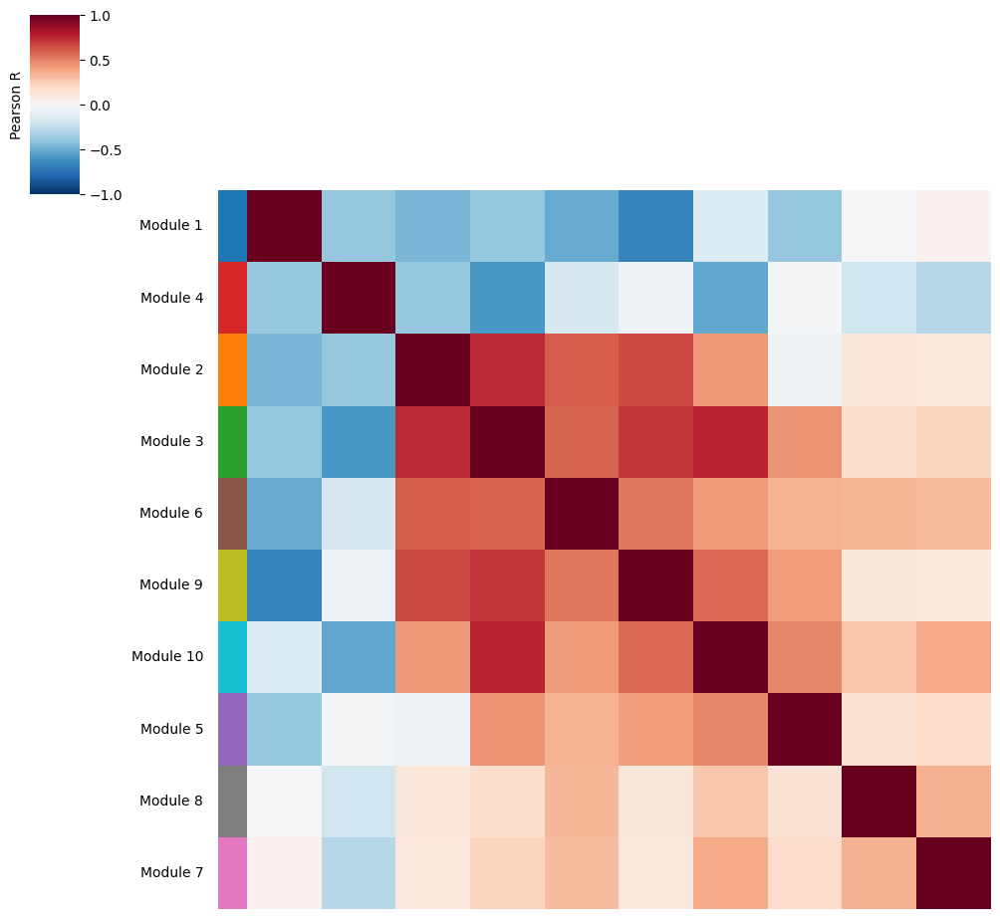

In [17]:
harreman.pl.module_score_correlation_plot(adata, col_cluster=False, row_cluster=False)

Eventually, modules can be grouped together into super-modules and we recompute the scores using the same approach as in the original Hotspot algorithm.

In [18]:
super_module_dict = {
    1: [1],
    2: [2, 3],
    3: [4],
    4: [5],
    5: [6, 9, 10],
    6: [7],
    7: [8],
}

In [19]:
harreman.hs.calculate_super_module_scores(adata, super_module_dict=super_module_dict)

 43%|████▎     | 3/7 [00:00<00:00,  6.41it/s]

100%|██████████| 7/7 [00:00<00:00,  7.10it/s]

Finished computing super-module scores in 0.991 seconds


We can then visualize the pairwise correlation plot at the super-module level.

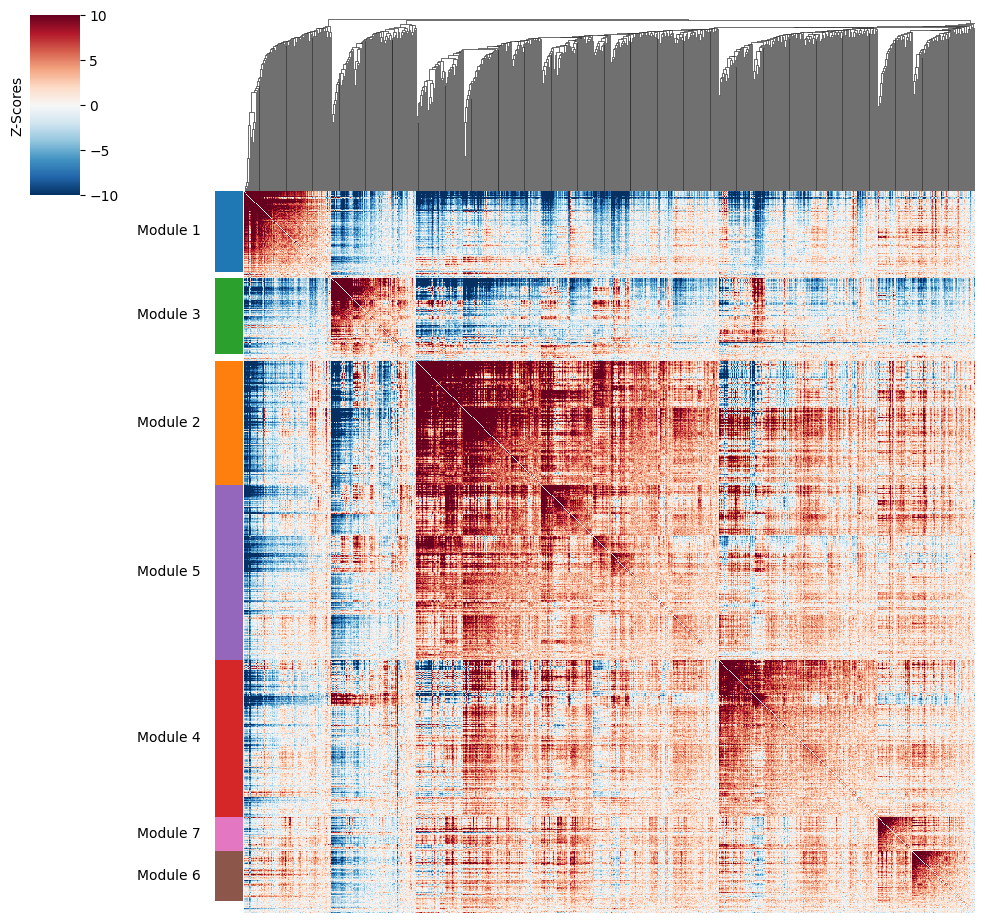

In [20]:
harreman.pl.local_correlation_plot(adata, use_super_modules=True, show=False)

And super-module scores are computed.

In [21]:
super_modules = adata.obsm['super_module_scores'].columns
adata.obs[super_modules] = adata.obsm['super_module_scores']

[<Axes: title={'center': 'Module 1'}, xlabel='spatial1', ylabel='spatial2'>,
 <Axes: title={'center': 'Module 2'}, xlabel='spatial1', ylabel='spatial2'>,
 <Axes: title={'center': 'Module 3'}, xlabel='spatial1', ylabel='spatial2'>,
 <Axes: title={'center': 'Module 4'}, xlabel='spatial1', ylabel='spatial2'>,
 <Axes: title={'center': 'Module 5'}, xlabel='spatial1', ylabel='spatial2'>,
 <Axes: title={'center': 'Module 6'}, xlabel='spatial1', ylabel='spatial2'>,
 <Axes: title={'center': 'Module 7'}, xlabel='spatial1', ylabel='spatial2'>]

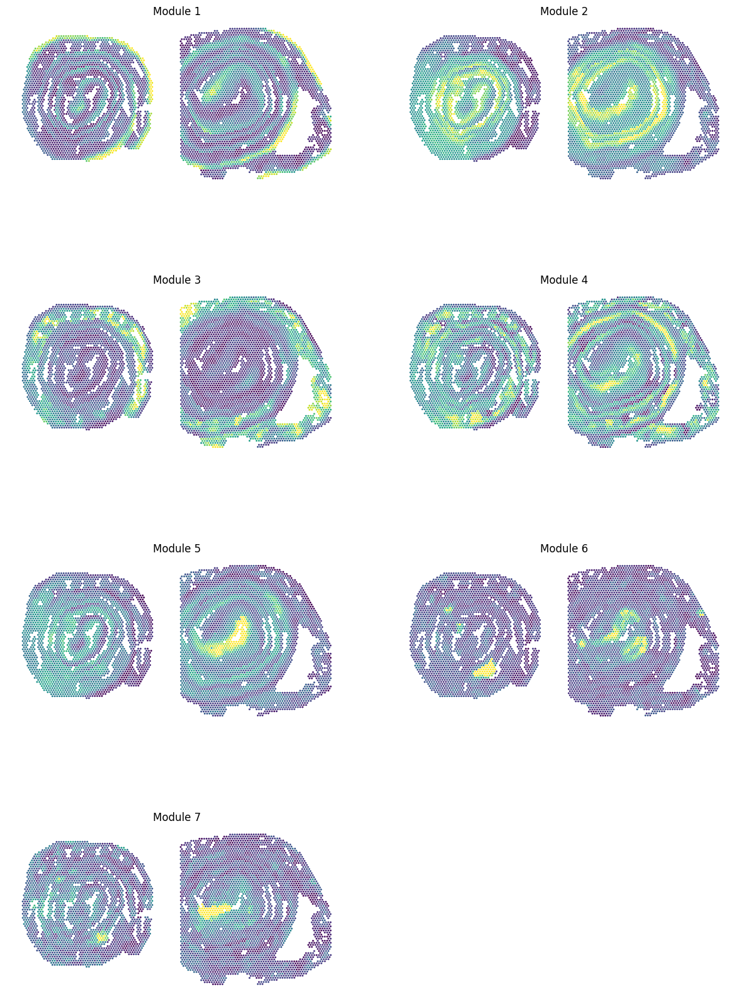

In [22]:
sc.pl.spatial(adata, color=super_modules, spot_size=80, frameon=False, vmin="p1", vmax="p99", ncols=2, cmap='viridis', colorbar_loc=None, show=False)

Additionally, the dominant module (`use_super_modules=False`) or super-module (`use_super_modules=True`) can be assigned to each cell or spot by using the `compute_top_scoring_modules` function. Here, we Z-normalize all module scores across spots, and then require a top-scoring spot to very specifically express a given module and not express any others. To ensure this, we require top-scoring spots to have (1) a score of >1 standard deviation (specified by the `sd` parameter; `sd=1` by default) above its mean module score, and (2) a score of <1 standard deviation above the mean for all other modules. If the first condition is not met, that is, if none of the modules has a value higher than 1 standard deviation above the mean for a given spot, then the module with the highest Z-normalized value is assigned to the spot. In case the second condition is not met, that is, if there is more than one module with a value higher than 1 standard deviation above the mean for a given spot, then the module with the highest Z-normalized value among those modules that meet condition (1) is selected. Finally, if none of the modules have a higher value than the mean for a given spot, then this spot ends up unassigned.

The `use_super_modules` parameters specifies whether top-scoring modules should be computed at the module (`False`) or super-module (`True`) level.

In [23]:
adata.obs['top_super_module'] = harreman.hs.compute_top_scoring_modules(adata, sd=1, use_super_modules=True)

We load the individual samples separately to visualize the top-scoring super-modules in the H&E images.

In [24]:
d0_adata = harreman.datasets.load_visium_mouse_colon_dataset(sample='d0')
d14_adata = harreman.datasets.load_visium_mouse_colon_dataset(sample='d14')

100%|██████████| 399M/399M [00:09<00:00, 45.8MB/s] 
100%|██████████| 495M/495M [00:10<00:00, 49.8MB/s] 


In [25]:
d0_adata.obs['top_super_module'] = adata.obs['top_super_module']
d14_adata.obs['top_super_module'] = adata.obs['top_super_module']

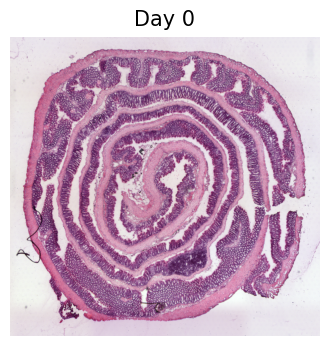

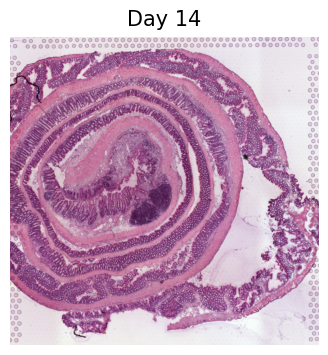

In [26]:
for ad_ in [d0_adata, d14_adata]:
    with mplscience.style_context():
        cond = ad_.obs['cond'].unique()[0]
        sc.pl.spatial(ad_, frameon=False, title=cond, show=False, img_key='hires')

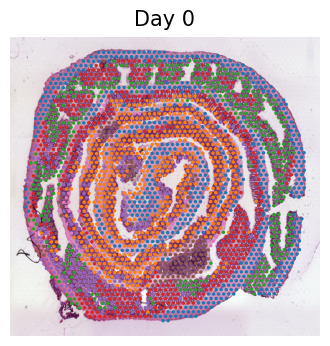

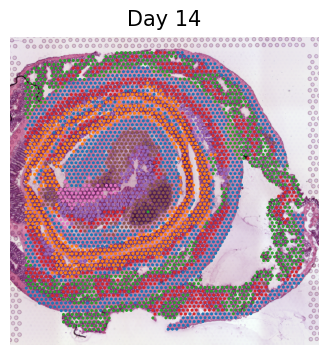

In [27]:
for ad_ in [d0_adata, d14_adata]:
    with mplscience.style_context():
        cond = ad_.obs['cond'].cat.categories[0]
        sc.pl.spatial(ad_, color='top_super_module', frameon=False, spot_size=70, img_key="hires", legend_loc=None, title=cond, show=False)

To identify super-modules that vary across the proximal-distal or serosa-luminal axes, we perform polynomial regression on each of the two samples separately.

In [28]:
fraction_data = adata.obs.groupby(['cond', 'top_super_module'])['cond'].count()

In [29]:
fraction_data = fraction_data.rename("n")
fraction_df = fraction_data.reset_index()
fraction_df["Fraction"] = fraction_data.groupby(level=0).apply(lambda x: x / float(x.sum())).values
fraction_df = fraction_df[fraction_df.n != 0]

In [30]:
fraction_df['cond'] = fraction_df['cond'].cat.reorder_categories(['Day 14', 'Day 0'])

In [31]:
conditions = adata.obs['cond'].cat.categories

In [32]:
from_cond_to_name = {
    'Day 0': 'd0',
    'Day 14': 'd14',
}

In [33]:
super_modules = adata.obsm['super_module_scores'].columns

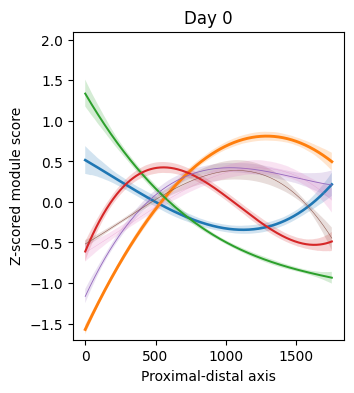

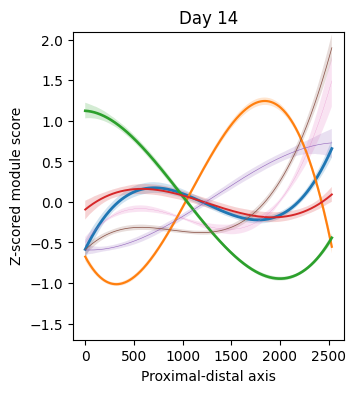

In [34]:
for cond in conditions:
    cond_adata = adata[adata.obs['cond'] == cond].copy()
    polynomial_regression(adata=cond_adata, cond=cond, super_modules=super_modules, fraction_df=fraction_df, var='ord', degree = 3, figsize=(3.5,4), xlabel='Proximal-distal axis', y_min=-1.7, y_max=2.1)
    plt.show()
    plt.close()

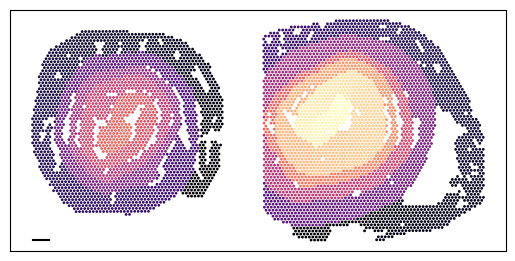

In [35]:
ax = plt.subplot(111)
ax.set_aspect('equal', adjustable='box')

distance = 500

ax.yaxis.set_ticks_position("left")
ax.xaxis.set_ticks_position("bottom")
plt.xticks([])
plt.yticks([])

x_start, y_start = min(adata.obsm['spatial'][:, 0]), max(adata.obsm['spatial'][:, 1])
x_end, y_end = x_start + distance, y_start

plt.scatter(
    adata.obsm['spatial'][:, 0],
    -adata.obsm['spatial'][:, 1],
    alpha=1,
    s=1,
    c=adata.obs['ord'],
    cmap='magma',
)

ax.plot([x_start, x_end], [-y_start, -y_end], color='black')

plt.show()
plt.close()

In [36]:
n_bins = 100
adata.obs['dist_norm'] = np.nan
for cond in conditions:
    cond_adata = adata[adata.obs['cond'] == cond].copy()
    cond_adata.obs['ord_bin'] = pd.cut(cond_adata.obs['ord'], bins=n_bins, labels=False)
    y_min_global = cond_adata.obs['dist'].min()
    y_max_global = cond_adata.obs['dist'].max()
    def dist_normalization(y):
        y_max = y.max()
        y_min = y.min()
        return y_min_global + (((y - y_min) / (y_max - y_min)) * (y_max_global / 2))
    cond_adata.obs['dist_norm'] = cond_adata.obs.groupby('ord_bin')['dist'].transform(dist_normalization)
    adata.obs['dist_norm'][adata.obs['cond'] == cond] = cond_adata.obs['dist_norm']

In [37]:
conditions = adata.obs['cond'].cat.categories

In [38]:
from_cond_to_name = {
    'Day 0': 'd0',
    'Day 14': 'd14',
}

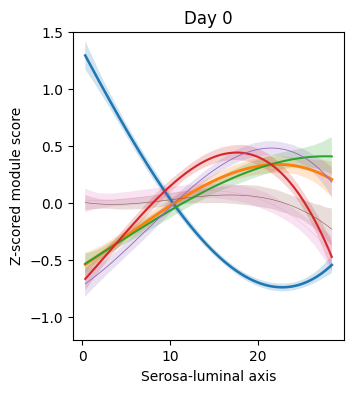

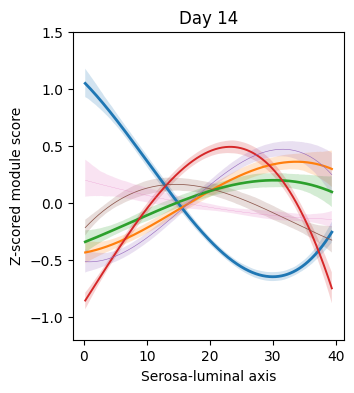

In [39]:
for cond in conditions:
    cond_adata = adata[adata.obs['cond'] == cond].copy()
    polynomial_regression(adata=cond_adata, cond=cond, super_modules=super_modules, fraction_df=fraction_df, var='dist_norm', degree = 3, figsize=(3.5,4), xlabel='Serosa-luminal axis', y_min=-1.2, y_max=1.5)
    plt.show()
    plt.close()

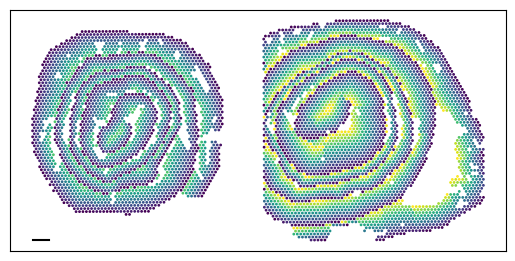

In [40]:
ax = plt.subplot(111)
ax.set_aspect('equal', adjustable='box')

distance = 500

ax.yaxis.set_ticks_position("left")
ax.xaxis.set_ticks_position("bottom")
plt.xticks([])
plt.yticks([])

x_start, y_start = min(adata.obsm['spatial'][:, 0]), max(adata.obsm['spatial'][:, 1])
x_end, y_end = x_start + distance, y_start

plt.scatter(
    adata.obsm['spatial'][:, 0],
    -adata.obsm['spatial'][:, 1],
    alpha=1,
    s=1,
    c=adata.obs['dist_norm'],
    cmap='viridis',
)

ax.plot([x_start, x_end], [-y_start, -y_end], color='black')

plt.show()
plt.close()

Finally, we save the AnnData to use it in the [following tutorial](https://harreman.readthedocs.io/en/latest/tutorials/notebooks/Visium_colon_metabolic_crosstalk.html).

In [ ]:
harreman.write_h5ad(adata, 'Visium_colon_metabolic_zonation.h5ad')